# Semantic segmentation using TAO Mask2former

[Masked-attention Mask Transformer for Universal Image Segmentation (Mask2former)](https://arxiv.org/pdf/2112.01527.pdf) is a high-quality Transformer-based segmentation framework for instance, semantic and panoptic segmentation. Mask2former takes RGB images as inputs and generates mask predictions and their associated categories.

Transfer learning is the process of transferring learned features from one application to another. It is a commonly used training technique where you use a model trained on one task and re-train to use it on a different task. 

Train Adapt Optimize (TAO) Toolkit  is a simple and easy-to-use Python based AI toolkit for taking purpose-built AI models and customizing them with users' own data.

<img align="center" src="https://d29g4g2dyqv443.cloudfront.net/sites/default/files/akamai/TAO/tlt-tao-toolkit-bring-your-own-model-diagram.png" width="1080">

## Sample prediction of Mask2former model
<img align="center" src="https://github.com/vpraveen-nv/model_card_images/blob/main/cv/notebook/common/mal_sample.jpg?raw=true" width="960">

## Learning Objectives

In this notebook, you will learn how to leverage the simplicity and convenience of TAO to:

* Take a pretrained model and train a Mask2former model on COCO dataset
* Evaluate the trained model
* Run inference with the trained model and visualize the result

## Table of Contents

This notebook shows an example usecase of Mask2former using Train Adapt Optimize (TAO) Toolkit.

0. [Set up env variables and map drives](#head-0)
1. [Installing the TAO launcher](#head-1)
2. [Prepare dataset and download pretrained model](#head-2)
3. [Provide training specification](#head-3)
4. [Run TAO training](#head-4)
5. [Evaluate a trained model](#head-5)
6. [Run inference](#head-6)
7. [Deploy](#head-7)

## 0. Set up env variables and map drives <a class="anchor" id="head-0"></a>

The following notebook requires the user to set an env variable called the `$LOCAL_PROJECT_DIR` as the path to the users workspace. Please note that the dataset to run this notebook is expected to reside in the `$LOCAL_PROJECT_DIR/data`, while the TAO experiment generated collaterals will be output to `$LOCAL_PROJECT_DIR/mask2former/`. More information on how to set up the dataset and the supported steps in the TAO workflow are provided in the subsequent cells.

The TAO launcher uses docker containers under the hood, and **for our data and results directory to be visible to the docker, they need to be mapped**. The launcher can be configured using the config file `~/.tao_mounts.json`. Apart from the mounts, you can also configure additional options like the Environment Variables and amount of Shared Memory available to the TAO launcher. <br>

`IMPORTANT NOTE:` The code below creates a sample `~/.tao_mounts.json`  file. Here, we can map directories in which we save the data, specs, results and cache. You should configure it for your specific case so these directories are correctly visible to the docker container.


In [1]:
!pwd

/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former


In [2]:
import os

# Please define this local project directory that needs to be mapped to the TAO docker session.
%env LOCAL_PROJECT_DIR=/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former

os.environ["HOST_DATA_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "data")
os.environ["HOST_RESULTS_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "mask2former")
os.environ["HOST_EXPS_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "experiments")
os.environ["HOST_DATAS_DIR"] = os.path.join(os.getenv("LOCAL_PROJECT_DIR", os.getcwd()), "datasets")

# Set this path if you don't run the notebook from the samples directory.
# %env NOTEBOOK_ROOT=~/tao-samples/mask2former

# The sample spec files are present in the same path as the downloaded samples.
os.environ["HOST_SPECS_DIR"] = os.path.join(
    os.getenv("NOTEBOOK_ROOT", os.getcwd()),
    "specs"
)

env: LOCAL_PROJECT_DIR=/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former


In [3]:
! mkdir -p $HOST_DATA_DIR
! mkdir -p $HOST_SPECS_DIR
! mkdir -p $HOST_RESULTS_DIR
! mkdir -p $HOST_EXPS_DIR
! mkdir -p $HOST_DATAS_DIR

In [4]:
# Mapping up the local directories to the TAO docker.
import json
import os
mounts_file = os.path.expanduser("~/.tao_mounts.json")
tao_configs = {
   "Mounts":[
         # Mapping the Local project directory
        {
            "source": os.environ["LOCAL_PROJECT_DIR"],
            "destination": "/workspace/tao-experiments"
        },
       {
           "source": os.environ["HOST_DATA_DIR"],
           "destination": "/data"
       },
       {
           "source": os.environ["HOST_SPECS_DIR"],
           "destination": "/specs"
       },
       {
           "source": os.environ["HOST_RESULTS_DIR"],
           "destination": "/results"
       },
       {
           "source": os.environ["HOST_EXPS_DIR"],
           "destination": "/experiments"
       },
       {
           "source": os.environ["HOST_DATAS_DIR"],
           "destination": "/datasets"
       },
   ],
   "DockerOptions": {
        "shm_size": "16G",
        "ulimits": {
            "memlock": -1,
            "stack": 67108864
         },
        # "user": "{}:{}".format(os.getuid(), os.getgid()),
        "network": "host"
   }
}
# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(tao_configs, mfile, indent=4)

In [5]:
!cat ~/.tao_mounts.json

{
    "Mounts": [
        {
            "source": "/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former",
            "destination": "/workspace/tao-experiments"
        },
        {
            "source": "/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/data",
            "destination": "/data"
        },
        {
            "source": "/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/specs",
            "destination": "/specs"
        },
        {
            "source": "/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/mask2former",
            "destination": "/results"
        },
        {
            "source": "/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/experiments",
            "destination": "/experiments"
        },
        {
            "source": "/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/datasets",
            "destination": "

## 1. Installing the TAO launcher <a class="anchor" id="head-1"></a>
The TAO launcher is a python package distributed as a python wheel listed in the `nvidia-pyindex` python index. You may install the launcher by executing the following cell.

Please note that TAO Toolkit recommends users to run the TAO launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

```sh
export VIRTUALENVWRAPPER_PYTHON=/path/to/bin/python3.x
```
where x >= 6 and <= 8

We recommend performing this step first and then launching the notebook from the virtual environment. In addition to installing TAO python package, please make sure of the following software requirements:
* python >=3.7, <=3.10.x
* docker-ce > 19.03.5
* docker-API 1.40
* nvidia-container-toolkit > 1.3.0-1
* nvidia-container-runtime > 3.4.0-1
* nvidia-docker2 > 2.5.0-1
* nvidia-driver > 455+

Once you have installed the pre-requisites, please log in to the docker registry nvcr.io by following the command below

```sh
docker login nvcr.io
```

You will be triggered to enter a username and password. The username is `$oauthtoken` and the password is the API key generated from `ngc.nvidia.com`. Please follow the instructions in the [NGC setup guide](https://docs.nvidia.com/ngc/ngc-overview/index.html#generating-api-key) to generate your own API key.

Please note that TAO Toolkit recommends users to run the TAO launcher in a virtual env with python >=3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the virtualenv and virtualenvwrapper packages.

In [6]:
# SKIP this step IF you have already installed the TAO launcher.
!pip3 install nvidia-pyindex
!pip3 install nvidia-tao

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [7]:
# View the versions of the TAO launcher
!tao info

Configuration of the TAO Toolkit Instance
task_group: ['model', 'dataset', 'deploy']
format_version: 3.0
toolkit_version: 5.5.0
published_date: 08/26/2024


## 2. Prepare dataset and download pretrained model <a class="anchor" id="head-2"></a>

### 2.1 Prepare dataset

 We will be using the COCO dataset for the tutorial. The following script will download COCO dataset automatically.

In [6]:
# Create local dir
!mkdir -p $HOST_DATA_DIR
# Download the data
!bash $HOST_SPECS_DIR/download_coco.sh $HOST_DATA_DIR

+ '[' -z /home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/data ']'
+ UNZIP='unzip -nq'
+ OUTPUT_DIR=/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/data/raw-data
+ mkdir -p /home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/data/raw-data
++ pwd
+ CURRENT_DIR=/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former
+ cd /home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/data/raw-data
+ BASE_IMAGE_URL=http://images.cocodataset.org/zips
+ TRAIN_IMAGE_FILE=train2017.zip
+ download_and_unzip http://images.cocodataset.org/zips train2017.zip
+ local BASE_URL=http://images.cocodataset.org/zips
+ local FILENAME=train2017.zip
+ '[' '!' -f train2017.zip ']'
++ pwd
+ echo 'Downloading train2017.zip to /home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/data/raw-data'
+ wget -nd -c http://images.cocodataset.org/zips/train2017.zip
--2025-05-13 08:28:02--  http://images.co

In [8]:
# Verification
!ls -l $HOST_DATA_DIR/raw-data

total 4252
drwxrwxrwx 2 lidar lidar    4096 May 15 11:28 annotations
drwxr-xr-x 2 lidar lidar 1961984 May  5 16:06 semantic_training
drwxr-xr-x 2 lidar lidar  184320 May  5 16:06 semantic_validation
drwxrwxrwx 2 lidar lidar 1990656 May  5 16:07 training
drwxrwxr-x 2 lidar lidar    4096 May 15 15:18 validation
drwxrwxrwx 2 lidar lidar  192512 May  5 16:07 validation_orig


### 2.2 Download pretrained model

 We will download the original Swin-Tiny model from GitHub. 
 For more details about the model, please refer to https://github.com/microsoft/Swin-Transformer.

In [ ]:
# Download the pretrained model
!wget https://github.com/SwinTransformer/storage/releases/download/v1.0.8/swin_tiny_patch4_window7_224_22k.pth -P $LOCAL_PROJECT_DIR/mask2former

In [ ]:
print("Check that model is downloaded into dir.")
!ls -l $LOCAL_PROJECT_DIR/mask2former/swin_tiny_patch4_window7_224_22k.pth

In [11]:
!ls -lh $LOCAL_PROJECT_DIR/mask2former

total 675M
drwxr-xr-x 2 root  root  4.0K Apr 23 13:50 evaluate
drwxr-xr-x 2 root  root  4.0K Apr 23 16:56 export
drwxr-xr-x 2 root  root  4.0K Apr 23 17:02 gen_trt_engine
drwxr-xr-x 2 root  root  4.0K Apr 23 16:52 inference
-rw-rw-r-- 1 lidar lidar 505M Apr 17 17:56 self_train_model_final.pth
-rw-r--r-- 1 root  root  1.5K Apr 23 20:32 status.json
-rw-rw-r-- 1 lidar lidar 171M May 11  2022 swin_tiny_patch4_window7_224_22k.pth
drwxr-xr-x 3 root  root  4.0K Apr 23 19:43 train
drwxr-xr-x 2 root  root  4.0K Apr 23 17:09 trt_inference


## 3. Provide experiment spec file <a class="anchor" id="head-3"></a>

We provide a specification file to configure the key parameters for this demo including:

* experiment config: configure the global experiment settings
    * num_nodes: number of nodes (num_nodes=1 for single node)
    * results_dir: the directory where your checkpoints will be saved
    * checkpoint: pretrained weights (can be either a pretrained backbone model or a trained Mask2former model)
* data config: configure the training and validation data
    * train: training data config. required to be in COCO Panoptic format
    * val: validation data config. required to be in COCO Panoptic format
    * test: data config for test images
* model config: configure the model setting
    * backbone: the backbone config for Mask2former
    * mode: prediction mode. Either "panoptic", "semantic" or "instance"
* train_config: configure the training hyperparameters

* **Note that the sample spec is not meant to produce SOTA accuracy on COCO. To reproduce SOTA, you might want to use TAO to train an ImageNet model first and follow the original parameters for COCO.**

Please refer to the TAO documentation about Mask2former to get all the parameters that are configurable.


In [9]:
# !cat $HOST_SPECS_DIR/spec.yaml

!cat $HOST_SPECS_DIR/spec_inst.yaml
# !cat $HOST_SPECS_DIR/spec_inst_swinL.yaml

results_dir: /results/
dataset:
  contiguous_id: True
  label_map: /specs/merged_labelmap.json
  train:
    type: 'coco'
    name: "coco_2020_train"
    instance_json: "/data/raw-data/annotations/training_shape_training2020.json"
    img_dir: "/data/raw-data/training"
    batch_size: 16
    num_workers: 2
  val:
    type: 'coco'
    name: "coco_2020_val"
    instance_json: "/data/raw-data/annotations/training_shape_training2020.json"
    img_dir: "/data/raw-data/training"
    batch_size: 1
    num_workers: 2
  test:
    img_dir: /data/raw-data/validation
    batch_size: 1
  augmentation:
    train_min_size: [640]
    train_max_size: 2048
    train_crop_size: [640, 640]
    test_min_size: 640
    test_max_size: 2048
train:
  precision: 'fp16'
  num_gpus: 1
  checkpoint_interval: 1
  validation_interval: 1
  num_epochs: 40
  optim:
    lr_scheduler: "MultiStep"
    milestones: [34, 38]
    type: "AdamW"
    lr: 0.0001
    weight_decay: 0.05
model:
  object_mask_threshold: 0.1
  overlap_t

## 4. Run TAO training <a class="anchor" id="head-4"></a>
* WARNING: COCO training takes about 40+ hours to complete using 8 V100 gpus. As a result, **we highly recommend that you run training with multiple high-end gpus (e.g. V100, A100)**

In [18]:
# NOTE: The following paths are set from the perspective of the TAO Docker.

# The data is saved here
%env DATA_DIR=/data
%env SPECS_DIR=/specs
%env RESULTS_DIR=/results
%env EXPS_DIR=/experiments
%env DATAS_DIR=/datasets

env: DATA_DIR=/data
env: SPECS_DIR=/specs
env: RESULTS_DIR=/results
env: EXPS_DIR=/experiments
env: DATAS_DIR=/datasets


In [ ]:
print("For multi-GPU, set NUM_TRAIN_GPUS based on your machine.")
os.environ["NUM_TRAIN_GPUS"] = "1"
# !tao model mask2former train -e $SPECS_DIR/spec.yaml \
#            train.num_gpus=$NUM_TRAIN_GPUS \
#            results_dir=$RESULTS_DIR
           
!tao model mask2former train -e $SPECS_DIR/spec_inst.yaml \
           train.num_gpus=$NUM_TRAIN_GPUS \
           results_dir=$RESULTS_DIR
           
# !tao model mask2former train -e $SPECS_DIR/spec_inst_swinL.yaml \
#            train.num_gpus=$NUM_TRAIN_GPUS \
#            results_dir=$RESULTS_DIR

For multi-GPU, set NUM_TRAIN_GPUS based on your machine.
2025-06-09 16:52:23,134 [TAO Toolkit] [INFO] root 160: Registry: ['nvcr.io']
2025-06-09 16:52:23,187 [TAO Toolkit] [INFO] nvidia_tao_cli.components.instance_handler.local_instance 360: Running command in container: nvcr.io/nvidia/tao/tao-toolkit:5.5.0-pyt
2025-06-09 16:52:23,203 [TAO Toolkit] [WARNING] nvidia_tao_cli.components.docker_handler.docker_handler 288: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/lidar/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2025-06-09 16:52:23,203 [TAO Toolkit] [INFO] nvidia_tao_cli.components.docker_handler.docker_handler 301: Printing tty value True
[2025-06-09 08:52:27,457 - TAO Toolkit - matplotlib.font_manager - INFO] generated new fontManager
sys:1: UserWarning: 
'spec_inst.yaml' is validated 

IOStream.flush timed out


Epoch 35:   0%|          | 0/2388 [00:00<?, ?it/s, v_num=1, train_loss=25.70, lr=1e-5, val_loss=24.60, mIoU=0.463, all_acc=0.885]_acc=0.885]

In [10]:
print('Model checkpoints:')
print('---------------------')
!ls -ltrh $HOST_RESULTS_DIR/train/

Model checkpoints:
---------------------
total 76K
drwxr-xr-x 3 root  root  4.0K Apr 22 14:31 lightning_logs
-rw-r--r-- 1 root  root  4.7K Jun  9 16:52 experiment.yaml
lrwxrwxrwx 1 root  root    19 Jun  9 21:21 mask2former_model_latest.pth -> model_epoch_039.pth
-rw-r--r-- 1 root  root   54K Jun  9 21:21 status.json
drwxrwxr-x 2 lidar lidar 4.0K Jun 12 09:25 swin_tiny


In [13]:
# You can set NUM_EPOCH to the epoch corresponding to any saved checkpoint
# %env NUM_EPOCH=029

# Get the name of the checkpoint corresponding to your set epoch
# tmp=!ls $HOST_RESULTS_DIR/train/*.pth | grep epoch_$NUM_EPOCH
# %env CHECKPOINT={tmp[0]}

# Or get the latest checkpoint
os.environ["CHECKPOINT"] = os.path.join(os.getenv("HOST_RESULTS_DIR"), "train/mask2former_model_latest.pth")

print('Rename a trained model: ')
print('---------------------')
!cp $CHECKPOINT $HOST_RESULTS_DIR/train/mask2former_model.pth
!ls -ltrh $HOST_RESULTS_DIR/train/mask2former_model.pth

Rename a trained model: 
---------------------
cp: cannot create regular file '/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/mask2former/train/mask2former_model.pth': Permission denied
ls: cannot access '/home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/mask2former/train/mask2former_model.pth': No such file or directory


## 5. Evaluate a trained model <a class="anchor" id="head-5"></a>

In this section, we run the `evaluate` tool to evaluate the trained model and produce the mIOU metric.

In `spec.yaml`, we specify a few key parameters for evaluation including:
* model config: configure the model setting
    * backbone: the backbone architecture for Mask2former
* dataset config: configure the training and validation datasets
    * val.img_dir: the root directory for validation images
    * val.panoptic_json: annotation file for validation data. required to be in COCO Panoptic format
    * val.panoptic_dir: root directory of panoptic segmentation images
* model config: configure the model setting
    * arch: the backbone architecture for Mask2former

In [ ]:
# Evaluate on TAO model
# !tao model mask2former evaluate -e $RESULTS_DIR/train/experiment.yaml evaluate.checkpoint=$RESULTS_DIR/train/mask2former_swint.pth
!tao model mask2former evaluate -e $EXPS_DIR/experiment.yaml evaluate.checkpoint=$EXPS_DIR/mask2former_swint.pth

In [19]:
!echo $SPECS_DIR
!echo $RESULTS_DIR
!echo $EXPS_DIR 
!echo $DATAS_DIR 

/specs
/results
/experiments
/datasets


## 6. Run Inference <a class="anchor" id="head-6"></a>
In this section, we run the `inference` tool to generate inferences on the trained models and visualize the results. The `inference` tool produces an output annotation json file with pseudo-mask info.

In `spec.yaml`, we specify a few key parameters for inference including:
* model config: configure the model setting
    * backbone: the backbone architecture for Mask2former
* dataset config: configure the training and validation datasets
    * test.img_dir: the root directory for validation images
    * test.batch_size: batch_size of input images
* model config: configure the model setting
    * arch: the backbone architecture for Mask2former
* augmentation config: configure the data preprocessing and augmentation
    * test_min_size: minimum length of input's height or width
    * test_max_size: maximum length of input's height or width

In [11]:
!echo $SPECS_DIR

In [14]:
# !tao model mask2former inference -e $SPECS_DIR/spec.yaml inference.checkpoint=$RESULTS_DIR/train/mask2former_model.pth
# !pwd

!tao model mask2former inference -e $SPECS_DIR/spec_inst.yaml inference.checkpoint=$EXPS_DIR/model_epoch_039.pth

# !tao model mask2former inference -e $EXPS_DIR/experiment.yaml inference.checkpoint=$EXPS_DIR/mask2former_swint.pth

2025-07-31 11:47:03,573 [TAO Toolkit] [INFO] root 160: Registry: ['nvcr.io']
2025-07-31 11:47:03,695 [TAO Toolkit] [INFO] nvidia_tao_cli.components.instance_handler.local_instance 360: Running command in container: nvcr.io/nvidia/tao/tao-toolkit:5.5.0-pyt
2025-07-31 11:47:03,725 [TAO Toolkit] [WARNING] nvidia_tao_cli.components.docker_handler.docker_handler 288: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/lidar/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2025-07-31 11:47:03,725 [TAO Toolkit] [INFO] nvidia_tao_cli.components.docker_handler.docker_handler 301: Printing tty value True
Docker instantiation failed with error: 500 Server Error: Internal Server Error ("could not select device driver "" with capabilities: [[gpu]]")


### 6.1. Visualize the result <a class="anchor" id="head-6-1"></a>

In [11]:
# install deps
!pip3 install Cython==0.29.36
!pip3 install numpy
!pip3 install pillow
!pip3 install "matplotlib>=3.3.3, <4.0"
!pip3 install pycocotools

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
ERROR: Operation cancelled by user
^C
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [53]:
!pip3 install "matplotlib>=3.3.3, <4.0"
!pip list | grep matplotlib

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
matplotlib                    3.10.1
matplotlib-inline             0.1.7


IMAGE_DIR: /home/lidar/tao_tutorials/notebooks/tao_launcher_starter_kit/mask2former/mask2former/inference


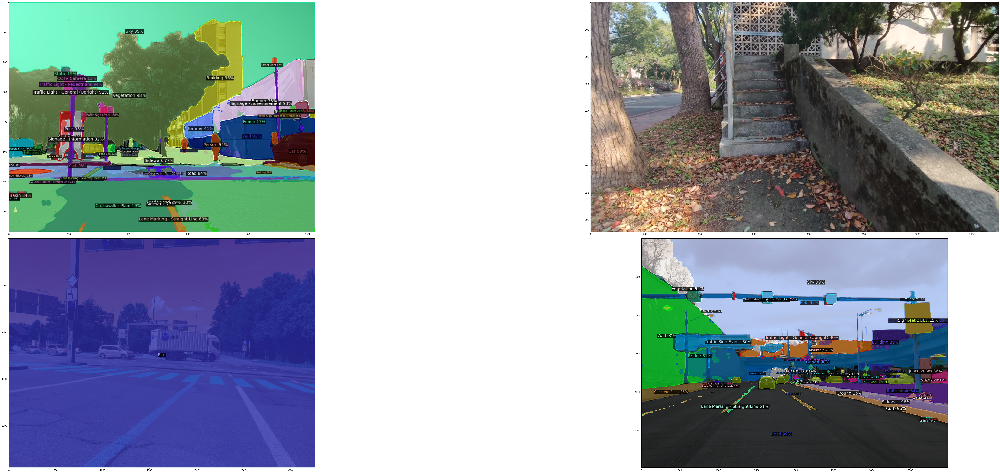

In [12]:
# Visualizing the sample images.
# IMAGE_DIR = os.path.join(os.environ['HOST_RESULTS_DIR'], "inference")
# IMAGE_DIR = os.path.join(os.environ['HOST_EXPS_DIR'], "mask2former_swint/inference")
IMAGE_DIR = os.path.join(os.environ['HOST_RESULTS_DIR'], "inference")
print(f'IMAGE_DIR: {IMAGE_DIR}')
COLS = 2 # number of columns in the visualizer grid.
IMAGES = 4 # number of images to visualize.
# Simple grid visualizer
# !pip3 install "matplotlib>=3.3.3, <4.0"
# import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg']

def visualize_images(output_path, num_cols=4, num_images=10):
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

visualize_images(IMAGE_DIR, num_cols=COLS, num_images=IMAGES)

## 7. Deploy

In [15]:
# Export the RGB model to ONNX model
# !tao model mask2former export \
#            -e $SPECS_DIR/spec.yaml \
#            export.checkpoint=$RESULTS_DIR/train/mask2former_model.pth \
#            export.onnx_file=$RESULTS_DIR/export/mask2former_model.onnx \
#            results_dir=$RESULTS_DIR/

!tao model mask2former export \
           -e $SPECS_DIR/spec_inst.yaml \
           export.checkpoint=$EXPS_DIR/model_epoch_039.pth \
           export.onnx_file=$EXPS_DIR/export/mask2former_swint_merged.onnx \
           results_dir=$EXPS_DIR/

2025-06-10 08:50:38,407 [TAO Toolkit] [INFO] root 160: Registry: ['nvcr.io']
2025-06-10 08:50:38,476 [TAO Toolkit] [INFO] nvidia_tao_cli.components.instance_handler.local_instance 360: Running command in container: nvcr.io/nvidia/tao/tao-toolkit:5.5.0-pyt
2025-06-10 08:50:38,485 [TAO Toolkit] [WARNING] nvidia_tao_cli.components.docker_handler.docker_handler 288: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/lidar/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2025-06-10 08:50:38,486 [TAO Toolkit] [INFO] nvidia_tao_cli.components.docker_handler.docker_handler 301: Printing tty value True
[2025-06-10 00:50:41,754 - TAO Toolkit - matplotlib.font_manager - INFO] generated new fontManager
sys:1: UserWarning: 
'spec_inst.yaml' is validated against ConfigStore schema with the same name.
This behav

In [16]:
# Generate TensorRT engine
# !tao deploy mask2former gen_trt_engine \
#            -e $SPECS_DIR/spec.yaml \
#            gen_trt_engine.onnx_file=$RESULTS_DIR/export/mask2former_model.onnx \
#            gen_trt_engine.trt_engine=$RESULTS_DIR/gen_trt_engine/mask2former_model.engine \
#            results_dir=$RESULTS_DIR/
!tao deploy mask2former gen_trt_engine \
           -e $SPECS_DIR/spec_inst.yaml \
           gen_trt_engine.onnx_file=$EXPS_DIR/export/mask2former_swint_merged.onnx \
           gen_trt_engine.trt_engine=$EXPS_DIR/gen_trt_engine/mask2former_swint_merged.engine \
           results_dir=$EXPS_DIR/

2025-06-10 08:51:35,091 [TAO Toolkit] [INFO] root 160: Registry: ['nvcr.io']
2025-06-10 08:51:35,145 [TAO Toolkit] [INFO] nvidia_tao_cli.components.instance_handler.local_instance 360: Running command in container: nvcr.io/nvidia/tao/tao-toolkit:5.5.0-deploy
2025-06-10 08:51:35,161 [TAO Toolkit] [WARNING] nvidia_tao_cli.components.docker_handler.docker_handler 288: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/lidar/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2025-06-10 08:51:35,161 [TAO Toolkit] [INFO] nvidia_tao_cli.components.docker_handler.docker_handler 301: Printing tty value True
[2025-06-10 00:51:36,295 - TAO Toolkit - matplotlib.font_manager - INFO] generated new fontManager
sys:1: UserWarning: 
'spec_inst.yaml' is validated against ConfigStore schema with the same name.
This be

In [ ]:
# Evaluate with generated TensorRT engine
# !tao deploy mask2former evaluate \
#             -e $SPECS_DIR/spec.yaml \
#             evaluate.trt_engine=$RESULTS_DIR/gen_trt_engine/mask2former_model.engine \
#             results_dir=$RESULTS_DIR/

!tao deploy mask2former evaluate \
            -e $SPECS_DIR/spec_inst.yaml \
            evaluate.trt_engine=$EXPS_DIR/gen_trt_engine/mask2former_swint_merged.engine \
            results_dir=$EXPS_DIR/

2025-04-25 21:52:09,833 [TAO Toolkit] [INFO] root 160: Registry: ['nvcr.io']
2025-04-25 21:52:09,873 [TAO Toolkit] [INFO] nvidia_tao_cli.components.instance_handler.local_instance 360: Running command in container: nvcr.io/nvidia/tao/tao-toolkit:5.5.0-deploy
2025-04-25 21:52:09,881 [TAO Toolkit] [WARNING] nvidia_tao_cli.components.docker_handler.docker_handler 288: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/lidar/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2025-04-25 21:52:09,881 [TAO Toolkit] [INFO] nvidia_tao_cli.components.docker_handler.docker_handler 301: Printing tty value True
[2025-04-25 13:52:11,161 - TAO Toolkit - matplotlib.font_manager - INFO] generated new fontManager
sys:1: UserWarning: 
'experiment.yaml' is validated against ConfigStore schema with the same name.
This b

In [11]:
!dpkg -l | grep nvinfer
!dpkg -l | grep TensorRT
!echo $LD_LIBRARY_PATH

/usr/lib/x86_64-linux-gnu:/opt/ros/galactic/opt/yaml_cpp_vendor/lib:/opt/ros/galactic/opt/rviz_ogre_vendor/lib:/opt/ros/galactic/lib/x86_64-linux-gnu:/opt/ros/galactic/lib:/home/lidar/TensorRT-8.5.3.1/lib:/usr/local/cuda-11.8/extras/CUPTI/lib64::/usr/local/cuda/lib64


In [29]:
# Inference with generated TensorRT engine
# !tao deploy mask2former inference \
#         -e $SPECS_DIR/spec.yaml \
#         inference.trt_engine=$RESULTS_DIR/gen_trt_engine/mask2former_model.engine \
#         results_dir=$RESULTS_DIR/
!tao deploy mask2former inference \
        -e $SPECS_DIR/spec_inst.yaml \
        inference.trt_engine=$EXPS_DIR/gen_trt_engine/mask2former_swint_merged.engine \
        results_dir=$EXPS_DIR/

2025-05-15 15:58:04,811 [TAO Toolkit] [INFO] root 160: Registry: ['nvcr.io']
2025-05-15 15:58:04,867 [TAO Toolkit] [INFO] nvidia_tao_cli.components.instance_handler.local_instance 360: Running command in container: nvcr.io/nvidia/tao/tao-toolkit:5.5.0-deploy
2025-05-15 15:58:04,882 [TAO Toolkit] [WARNING] nvidia_tao_cli.components.docker_handler.docker_handler 288: 
Docker will run the commands as root. If you would like to retain your
local host permissions, please add the "user":"UID:GID" in the
DockerOptions portion of the "/home/lidar/.tao_mounts.json" file. You can obtain your
users UID and GID by using the "id -u" and "id -g" commands on the
terminal.
2025-05-15 15:58:04,882 [TAO Toolkit] [INFO] nvidia_tao_cli.components.docker_handler.docker_handler 301: Printing tty value True
[2025-05-15 07:58:06,146 - TAO Toolkit - matplotlib.font_manager - INFO] generated new fontManager
sys:1: UserWarning: 
'spec_inst.yaml' is validated against ConfigStore schema with the same name.
This be

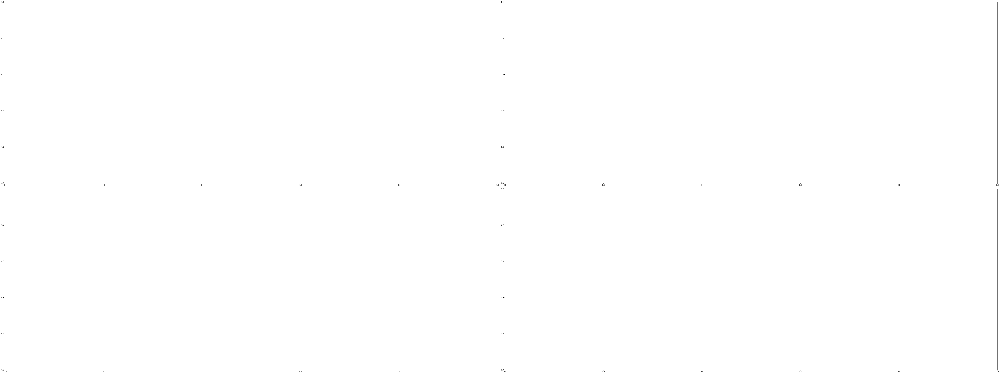

In [30]:
# Visualizing the sample images.
IMAGE_DIR = os.path.join(os.environ['HOST_RESULTS_DIR'], "trt_inference")
COLS = 2 # number of columns in the visualizer grid.
IMAGES = 4 # number of images to visualize.
# Simple grid visualizer
# !pip3 install "matplotlib>=3.3.3, <4.0"
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg']

def visualize_images(output_path, num_cols=4, num_images=10):
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

visualize_images(IMAGE_DIR, num_cols=COLS, num_images=IMAGES)

This notebook has come to an end.